# Application of Linear Algebra on Stock Exchange Data provided by B3
#### Análise dos Componentes Principais para Identificação de Oportunidades no Mercado de Ações

- **Aplicação da Análise Multivariada em Python para Otimização de Modelos Preditivos**

> Este estudo propõe a aplicação da Análise dos Componentes Principais (PCA) para identificar oportunidades no mercado de ações brasileiro. Utilizando a análise multivariada em Python, reduzimos a dimensionalidade dos dados e otimizamos os modelos preditivos. Os resultados mostram potencial para suporte a pesquisas financeiras, análises de investimentos e seleção criteriosa de ativos diversificados para mitigar riscos.

In [1]:
from IPython.display import Markdown as md
import matplotlib.gridspec as gridspec
from IPython.display import display
import plotly.graph_objects as go
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import ipywidgets as widgets
import plotly.express as px
from tqdm import tqdm
import seaborn as sns
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 10)
plt.style.use('ggplot')

## Metodologia
> Pela forma em que os dados foram organizados, foi necessário o desenvimento de um algoritmo para a manipulação, tratamento e organização dos dados brutos diretamente da própria B3. Sem essa adequação, não seria possivel o estudo com as metodologias adequadas para a manipulação e análise de dados, comprometendo assim um estudo conviável e replicável


| Atributo | Descrição                                |
|----------|------------------------------------------|
| TIPREG   | Tipo de registro                         |
| DATPRE   | Data de pregão                           |
| CODNEG   | Código de negociação do ativo            |
| NOMRES   | Nome resumido da empresa emissora do ativo |
| ESPECI   | Especificação do tipo de ação ou ativo   |
| PREABE   | Preço de abertura                        |
| PREMAX   | Preço máximo                             |
| PREMIN   | Preço mínimo                             |
| PREMED   | Preço médio                              |
| PREULT   | Preço de fechamento                      |
| PREOFC   | Preço da melhor oferta de compra         |
| PREOFV   | Preço da melhor oferta de venda          |
| QUATOT   | Quantidade total de títulos negociados    |
| VOLTOT   | Volume total de títulos negociados        |
| CODISI   | Código ISIN do ativo                      |
| DISMES   | Número de dias úteis do mês              |

In [2]:
def tratamento(caminho_arquivo):
    # Lista para armazenar os dados organizados
    ordem = []

    # Leitura do arquivo de dados brutos
    with open(caminho_arquivo, 'r') as arquivo:
        linhas = arquivo.readlines()

    # Configuração da barra de carregamento
    with tqdm(total=len(linhas), desc='Processando', bar_format='{l_bar}{bar}| {n_fmt}/{total_fmt}') as pbar:
        # Iteração pelas linhas do arquivo
        for linha in linhas:

            if linhas == '':
                continue

            # Extrai as informações de cada campo
            tipreg = int(linha[0:2])
            datpre = pd.to_datetime(linha[2:10], format='%Y%m%d', errors='coerce')
            if pd.isnull(datpre):
                continue
            codneg = linha[12:24].strip()
            nomres = linha[27:39].strip()
            especi = linha[39:49].strip()
            preabe = float(linha[56:69]) / 100
            premax = float(linha[69:82]) / 100
            premin = float(linha[82:95]) / 100
            premed = float(linha[95:108]) / 100
            preult = float(linha[108:121]) / 100
            preofc = float(linha[121:134]) / 100
            preofv = float(linha[134:147]) / 100
            quatot = int(linha[152:170])
            voltot = float(linha[170:188]) / 100
            codisi = linha[245:257].strip()
            dismes = int(linha[257:260]) if linha[257:260].strip() else 0

            # Adiciona os dados à lista
            ordem.append([tipreg, datpre, codneg, nomres, especi, preabe, premax, premin,
                                      premed, preult, preofc, preofv, quatot, voltot, codisi, dismes])

            # Atualiza a barra de carregamento
            pbar.update(1)

    # Criação do DataFrame com os dados organizados
    df = pd.DataFrame(ordem, columns=['TIPREG', 'DATPRE', 'CODNEG', 'NOMRES', 'ESPECI',
                                                   'PREABE', 'PREMAX', 'PREMIN', 'PREMED', 'PREULT',
                                                   'PREOFC', 'PREOFV', 'QUATOT', 'VOLTOT', 'CODISI', 'DISMES'])

    df_dict = {
        'TIPREG': 'Tipo de registro',
        'DATPRE': 'Data de pregão',
        'CODNEG': 'Código de negociação do ativo',
        'NOMRES': 'Nome resumido da empresa emissora do ativo',
        'ESPECI': 'Especificação do tipo de ação ou ativo',
        'PREABE': 'Preço de abertura',
        'PREMAX': 'Preço máximo',
        'PREMIN': 'Preço mínimo',
        'PREMED': 'Preço médio',
        'PREULT': 'Preço de fechamento',
        'PREOFC': 'Preço da melhor oferta de compra',
        'PREOFV': 'Preço da melhor oferta de venda',
        'QUATOT': 'Quantidade total de títulos negociados',
        'VOLTOT': 'Volume total de títulos negociados',
        'CODISI': 'Código ISIN do ativo',
        'DISMES': 'Número de dias úteis do mês'
    }

    df.rename(columns=df_dict)

    # Exibe o DataFrame
    return df

In [3]:
if False: # Só executar de a Contição for Verdaqdeira
    display(md('#### Início do Tratamento...'))
    df18 = tratamento('/kaggle/input/b3-data-analyctis/data/COTAHIST_A2018.TXT')
    df19 = tratamento('/kaggle/input/b3-data-analyctis/data/COTAHIST_A2019.TXT')
    df20 = tratamento('/kaggle/input/b3-data-analyctis/data/COTAHIST_A2020.TXT')
    df21 = tratamento('/kaggle/input/b3-data-analyctis/data/COTAHIST_A2021.TXT')
    df22 = tratamento('/kaggle/input/b3-data-analyctis/data/COTAHIST_A2022.TXT')

    df = pd.concat([df18, df19, df20, df21, df22], axis=0).reset_index(drop=True)

    display(md('#### Exportando Dados para Backup...'))
    df18.to_csv('COTAHIST_T2018.csv', sep =';')
    df19.to_csv('COTAHIST_T2019.csv', sep =';')
    df20.to_csv('COTAHIST_T2020.csv', sep =';')
    df21.to_csv('COTAHIST_T2021.csv', sep =';')
    df22.to_csv('COTAHIST_T2022.csv', sep =';')

    df.to_csv('COTAHIST_T1822.csv', sep =';')
    display(md('#### Dados Exportados e Prontos para a Análise `df`'))

## Realização das Análises dos Componentes
- Criação da **Matriz de Covariância**, para isso é necessário a padronização das variáveis para que sejam comparáveis entre si

In [4]:
df18 = pd.read_csv('/kaggle/input/b3-data-analyctis/processed/COTAHIST_T2018.csv', sep=';')
df19 = pd.read_csv('/kaggle/input/b3-data-analyctis/processed/COTAHIST_T2019.csv', sep=';')
df20 = pd.read_csv('/kaggle/input/b3-data-analyctis/processed/COTAHIST_T2020.csv', sep=';')
df21 = pd.read_csv('/kaggle/input/b3-data-analyctis/processed/COTAHIST_T2021.csv', sep=';')
df22 = pd.read_csv('/kaggle/input/b3-data-analyctis/processed/COTAHIST_T2022.csv', sep=';')

df = pd.read_csv('/kaggle/input/b3-data-analyctis/processed/COTAHIST_T1822.csv', sep=';')

In [5]:
df

,Unnamed: 0,TIPREG,DATPRE,CODNEG,NOMRES,ESPECI,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT,CODISI,DISMES
0,0,1,2018-01-02,AALR3,ALLIAR,ON NM,14.94,15.16,14.70,14.84,14.89,14.75,14.89,94500,1402991.00,NaN,0
1,1,1,2018-01-02,AALR3F,ALLIAR,ON NM,14.79,14.93,14.79,14.86,14.80,14.73,15.16,225,3343.84,NaN,0
2,2,1,2018-01-02,AAPL34,APPLE,DRN,56.81,56.81,56.30,56.38,56.30,55.00,56.30,900,50747.00,NaN,0
3,3,1,2018-01-02,AAPL34F,APPLE,DRN,56.81,65.00,56.54,59.63,56.54,54.59,62.00,61,3637.70,NaN,0
4,4,1,2018-01-02,ABCB2,ABC BRASIL,DIR PRE N2,4.11,4.20,4.11,4.14,4.20,4.13,6.00,1200,4977.00,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6560327,6560327,1,2022-12-05,BRFS3T,BRF SA,ON NM,8.56,8.57,8.25,8.40,8.26,0.00,0.00,20000,168151.75,NaN,0
6560328,6560328,1,2022-12-06,BRFS3T,BRF SA,ON NM,8.11,8.12,7.99,8.10,8.00,0.00,0.00,12100,98010.91,NaN,0
6560329,6560329,1,2022-12-12,BRFS3T,BRF SA,ON NM,7.48,7.49,7.04,7.16,7.05,0.00,0.00,30300,217028.59,NaN,0
6560330,6560330,1,2022-12-19,BRFS3T,BRF SA,ON NM,6.80,6.95,6.80,6.89,6.95,0.00,0.00,26700,183980.88,NaN,0


## Selação de Colunas Núméricas
> Para a realização da análise, só é possivel realizar em somente colunas numéricas

#### Escolha de Dados
> Para essa análise, foram escolhidas 5 anos de dados da bolsa de valores, nas quais serão análisadas o comportamente ao longo desses anos, e após isso a mesma análise será aplicada sobre os anos individualmente

In [6]:
numeric = ['PREABE', 'PREMAX', 'PREMIN', 'PREMED', 'PREULT', 'PREOFC', 'PREOFV', 'QUATOT', 'VOLTOT']

dfn18 = df18[numeric]
dfn19 = df19[numeric]
dfn20 = df20[numeric]
dfn21 = df21[numeric]
dfn22 = df22[numeric]

dfn = df[numeric]
dfn

,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT
0,14.94,15.16,14.70,14.84,14.89,14.75,14.89,94500,1402991.00
1,14.79,14.93,14.79,14.86,14.80,14.73,15.16,225,3343.84
2,56.81,56.81,56.30,56.38,56.30,55.00,56.30,900,50747.00
3,56.81,65.00,56.54,59.63,56.54,54.59,62.00,61,3637.70
4,4.11,4.20,4.11,4.14,4.20,4.13,6.00,1200,4977.00
...,...,...,...,...,...,...,...,...,...
6560327,8.56,8.57,8.25,8.40,8.26,0.00,0.00,20000,168151.75
6560328,8.11,8.12,7.99,8.10,8.00,0.00,0.00,12100,98010.91
6560329,7.48,7.49,7.04,7.16,7.05,0.00,0.00,30300,217028.59
6560330,6.80,6.95,6.80,6.89,6.95,0.00,0.00,26700,183980.88


## Padronização dos Dados `dfn`
- Criação da Matriz de Covariância, para isso é necessário a padronização das variáveis para que sejam comparáveis entre 

In [7]:
# Normalização
mean = np.mean(dfn, axis=0)
P = dfn - np.tile(mean, (dfn.shape[0], 1))
M = P / dfn.std()
M

,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT
0,-0.043674,-0.044451,-0.042948,-0.043721,-0.043724,-0.020440,-0.006722,-0.008249,-0.046725
1,-0.043759,-0.044580,-0.042898,-0.043710,-0.043775,-0.020555,-0.006454,-0.010433,-0.066931
2,-0.020173,-0.021119,-0.019560,-0.020406,-0.020486,0.209797,0.034420,-0.010417,-0.066247
3,-0.020173,-0.016531,-0.019425,-0.018582,-0.020351,0.207452,0.040084,-0.010436,-0.066927
4,-0.049753,-0.050591,-0.048902,-0.049726,-0.049723,-0.081189,-0.015555,-0.010410,-0.066908
...,...,...,...,...,...,...,...,...,...
6560327,-0.047255,-0.048143,-0.046575,-0.047336,-0.047445,-0.104813,-0.021516,-0.009975,-0.064552
6560328,-0.047508,-0.048395,-0.046721,-0.047504,-0.047591,-0.104813,-0.021516,-0.010158,-0.065564
6560329,-0.047862,-0.048748,-0.047255,-0.048031,-0.048124,-0.104813,-0.021516,-0.009736,-0.063846
6560330,-0.048243,-0.049050,-0.047390,-0.048183,-0.048180,-0.104813,-0.021516,-0.009819,-0.064323


### Matriz de Correlação

In [8]:
Cor = M.T.dot(M) / (dfn.shape[0] - 1)
Cor

,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT
PREABE,1.000000,0.999822,0.999850,0.999908,0.999756,0.102407,0.024848,-0.000482,0.162202
PREMAX,0.999822,1.000000,0.999628,0.999879,0.999845,0.104583,0.025448,-0.000490,0.161895
PREMIN,0.999850,0.999628,1.000000,0.999891,0.999833,0.100516,0.024322,-0.000475,0.162467
PREMED,0.999908,0.999879,0.999891,1.000000,0.999909,0.102493,0.024844,-0.000482,0.162199
PREULT,0.999756,0.999845,0.999833,0.999909,1.000000,0.102769,0.024902,-0.000483,0.162172
PREOFC,0.102407,0.104583,0.100516,0.102493,0.102769,1.000000,0.127642,-0.000530,0.007018
PREOFV,0.024848,0.025448,0.024322,0.024844,0.024902,0.127642,1.000000,-0.000126,0.001091
QUATOT,-0.000482,-0.000490,-0.000475,-0.000482,-0.000483,-0.000530,-0.000126,1.000000,0.036543
VOLTOT,0.162202,0.161895,0.162467,0.162199,0.162172,0.007018,0.001091,0.036543,1.000000


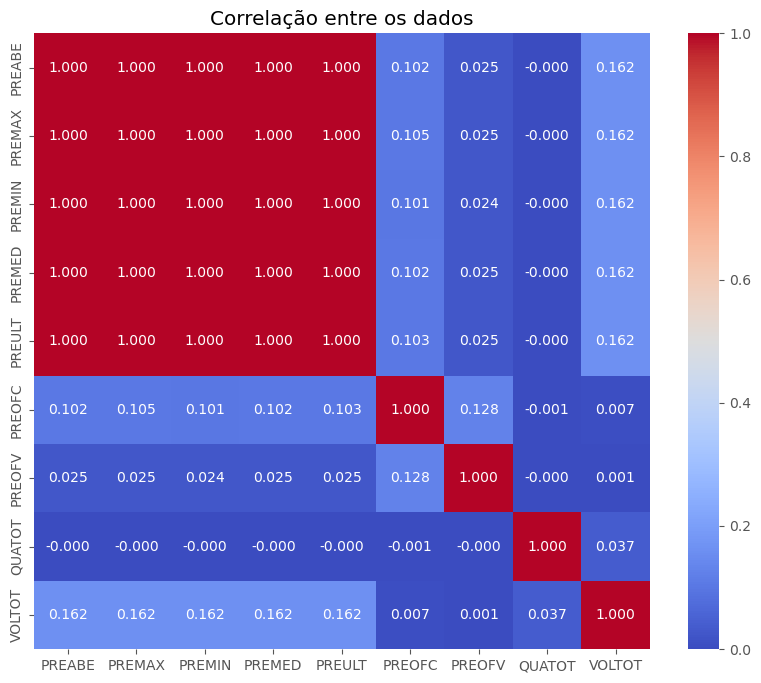

In [9]:
plt.figure(figsize=(10, 8))
sns.heatmap(Cor, annot=True, cmap='coolwarm', fmt=".3f", square=True)
plt.title('Correlação entre os dados')
plt.show()

### Matriz de Covariância

In [10]:
# Matriz de Covariância | Matriz Transposta
Cov = P.T.dot(P) / (dfn.shape[0] - 1)
Cov

,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT
PREABE,3.174195e+06,3.179761e+06,3.168479e+06,3.174055e+06,3.174085e+06,3.189591e+04,4.455717e+04,-3.710415e+07,2.001756e+10
PREMAX,3.179761e+06,3.186470e+06,3.173894e+06,3.180097e+06,3.180499e+06,3.263676e+04,4.572195e+04,-3.778570e+07,2.001832e+10
PREMIN,3.168479e+06,3.173894e+06,3.163721e+06,3.168761e+06,3.169085e+06,3.125525e+04,4.354217e+04,-3.646328e+07,2.001726e+10
PREMED,3.174055e+06,3.180097e+06,3.168761e+06,3.174502e+06,3.174724e+06,3.192425e+04,4.455270e+04,-3.710408e+07,2.001822e+10
PREULT,3.174085e+06,3.180499e+06,3.169085e+06,3.174724e+06,3.175522e+06,3.201528e+04,4.466452e+04,-3.712950e+07,2.001806e+10
PREOFC,3.189591e+04,3.263676e+04,3.125525e+04,3.192425e+04,3.201528e+04,3.056176e+04,2.245934e+04,-3.999221e+06,8.498620e+07
PREOFV,4.455717e+04,4.572195e+04,4.354217e+04,4.455270e+04,4.466452e+04,2.245934e+04,1.013037e+06,-5.462425e+06,7.607148e+07
QUATOT,-3.710415e+07,-3.778570e+07,-3.646328e+07,-3.710408e+07,-3.712950e+07,-3.999221e+06,-5.462425e+06,1.863302e+15,1.092670e+14
VOLTOT,2.001756e+10,2.001832e+10,2.001726e+10,2.001822e+10,2.001806e+10,8.498620e+07,7.607148e+07,1.092670e+14,4.798206e+15


## Busca dos Autovalores e Vetores da Matriz
- Encontrar os Autovetores e os Autovalores da Matriz de Covariância

In [11]:
autovalores, autovetores = np.linalg.eig(Cov)
display(md(f'### • 8 Autovalores\n> {autovalores}\n\n### • Autovetores\n> {autovetores}\n'))

auto = [(np.abs(autovalores[i]), autovetores[:, i]) for i in range(len(autovalores))]
auto.sort()
auto.reverse()

# Organizando os Autovalores e os Autovetores do menor para o maior
pd.DataFrame(auto, columns=['Autovalor', 'Autovetor'])

### • 8 Autovalores
> [4.80226823e+15 1.85923974e+15 1.54550610e+07 1.01285049e+06
 2.97702759e+04 1.16319164e+03 7.63306759e+02 4.47368118e+01
 1.30741473e+02]

### • Autovetores
> [[ 4.16519011e-06 -4.19952242e-07  4.47149513e-01 -3.16158925e-03
   3.61402794e-03  1.17356829e-01  7.01344167e-01 -4.02079930e-01
  -3.64297078e-01]
 [ 4.16534288e-06 -4.20333742e-07  4.48022116e-01 -2.08692252e-03
  -1.93351861e-02 -7.09141409e-01  1.10537855e-01  5.30265195e-01
  -5.11529517e-02]
 [ 4.16513219e-06 -4.19601748e-07  4.46378323e-01 -4.09672288e-03
   2.33160146e-02  6.86437223e-01 -1.12088818e-01  5.58932953e-01
  -6.33939775e-02]
 [ 4.16532771e-06 -4.19965415e-07  4.47194361e-01 -3.17006368e-03
   2.67874871e-03  1.28286858e-02 -4.82686950e-03 -2.77567282e-01
   8.50155355e-01]
 [ 4.16529341e-06 -4.19975808e-07  4.47245920e-01 -3.06303631e-03
  -2.83831381e-04 -1.05214024e-01 -6.95202405e-01 -4.09512420e-01
  -3.71332407e-01]
 [ 1.76539380e-08 -3.84778600e-09  4.58937387e-03  2.23570101e-02
  -9.99279482e-01  3.02432306e-02 -2.03560891e-03  6.98835084e-04
   5.78137277e-04]
 [ 1.57875428e-08 -4.45609096e-09  6.86422854e-03  9.99724761e-01
   2.24212894e-02  7.45704368e-04 -1.10402655e-04 -2.46838379e-05
   2.65063175e-05]
 [ 3.71530494e-02  9.99309587e-01  5.92408875e-07 -1.89647111e-10
  -4.69185934e-10  1.92728301e-10 -2.66738349e-12  6.61215975e-12
  -1.25054672e-12]
 [ 9.99309587e-01 -3.71530493e-02 -9.34212384e-06  4.87503766e-08
  -2.43174588e-08 -9.84620068e-09  1.07089689e-09 -1.40862174e-10
   2.66158185e-12]]


,Autovalor,Autovetor
0,4.802268e+15,"[4.16519010603465e-06, 4.1653428805168005e-06,..."
1,1.859240e+15,"[-4.1995224169625396e-07, -4.2033374246316415e..."
2,1.545506e+07,"[0.4471495127142793, 0.4480221158544861, 0.446..."
3,1.012850e+06,"[-0.003161589247361593, -0.0020869225180765168..."
4,2.977028e+04,"[0.0036140279423894544, -0.019335186051083565,..."
5,1.163192e+03,"[0.11735682900999088, -0.7091414094495393, 0.6..."
6,7.633068e+02,"[0.70134416742139, 0.11053785520961083, -0.112..."
7,1.307415e+02,"[-0.36429707778843606, -0.05115295171003773, -..."
8,4.473681e+01,"[-0.40207993024293304, 0.5302651950622466, 0.5..."


## Aplicação e Usabilidade | `PCA`
Com os autovalores estão representando a variabilidade dos nossos dados, ou seja, quão acumulado a variância dos nossos dados, e eles estão ordenados pelos autovalores, que representa a quantidade de variabilidade dos nossos dados. Para o calculo da variância explicada de cada autovalor é dada por\

In [12]:
# Soma  dos Autovalores
total_sum = sum(autovalores)
display(md(f'### Soma dos Autovalores\n> {total_sum}'))

# Visualização da porcentagem de variância dos dados totais que a primeira variavel acumula
var = [(i / total_sum) * 100 for i in sorted(autovalores, reverse=True)]
display(md(f'### Visualização da porcentagem de variância dos dados totais que a primeira variavel acumula\n> {[round(vars, 7) for vars in var]}')) # Pequena Amostra

### Soma dos Autovalores
> 6661507991534407.0

### Visualização da porcentagem de variância dos dados totais que a primeira variavel acumula
> [72.0898067, 27.9101931, 2e-07, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

,Autovalor (𝜆),Variância % (fi),Freq. Acumulada (Fi)
Componente,,,
PCA 1,4.802268e+15,7.208981e+01,72.089807
PCA 2,1.859240e+15,2.791019e+01,100.000000
PCA 3,1.545506e+07,2.320054e-07,100.000000
PCA 4,1.012850e+06,1.520452e-08,100.000000
PCA 5,2.977028e+04,4.468999e-10,100.000000
PCA 6,1.163192e+03,1.746139e-11,100.000000
PCA 7,7.633068e+02,1.145847e-11,100.000000
PCA 8,4.473681e+01,1.962641e-12,100.000000
PCA 9,1.307415e+02,6.715718e-13,100.000000


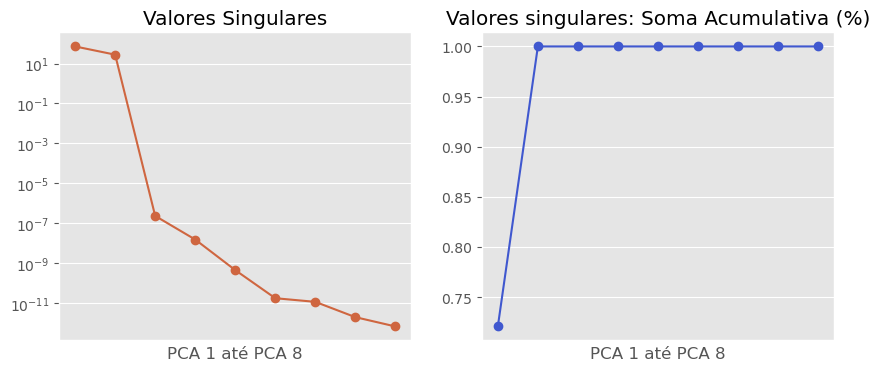

In [13]:
# Soma acumulativa
acum_var = np.cumsum(var)

# Criando um DataFrame para a visualização
comp = ['PCA %s' %i for i in range(1, len(autovalores) +1)]

# Criação do DataFrame para facilitar a Visualização
pca = pd.DataFrame({'Componente':comp, 'Autovalor (𝜆)':autovalores, 'Variância % (fi)':var, 'Freq. Acumulada (Fi)':acum_var}).set_index('Componente')
display(pca)

# Apartir da utilização de 4 componentes, não é possivel a visualização, pois é o Plano R4,
# Então, no minimo é possivel a visualização no Plano R3 com 3 componentes, 93%

fig = plt.figure(figsize=(10,4))
specs = gridspec.GridSpec( nrows=1, ncols=2, figure=fig)

ax1 = fig.add_subplot( specs[ 0 , 0 ] )
ax2 = fig.add_subplot( specs[ 0 , 1 ] )

ax1.semilogy(pca['Variância % (fi)'], '-o',  color='#cf6640')
ax1.set_title('Valores Singulares')
ax1.set_xlabel('PCA 1 até PCA 8')
ax1.set_xticks([])

ax2.plot(np.cumsum(pca['Variância % (fi)']) / np.sum(pca['Variância % (fi)']), '-o', color='#4058cf')
ax2.set_title('Valores singulares: Soma Acumulativa (%)');
ax2.set_xlabel('PCA 1 até PCA 8')
ax2.set_xticks([]);
plt.savefig('plot01.png', dpi=120)

In [14]:
n_comp = pca.shape[0]
autovetores = [i[1] for i in auto]
A = autovetores[:]

# Multiplicar a matriz pela matriz com 3 autovetores
X_ = np.dot(df[numeric], np.array(A).T)
dfpc = pd.DataFrame(X_,columns = ['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8', 'PCA 9'])
df['PCA 1'] = dfpc['PCA 1']
df['PCA 2'] = dfpc['PCA 2']
df['PCA 3'] = dfpc['PCA 3']
df['PCA 4'] = dfpc['PCA 4']
df['PCA 5'] = dfpc['PCA 5']
df['PCA 6'] = dfpc['PCA 6']
df['PCA 7'] = dfpc['PCA 7']
df['PCA 8'] = dfpc['PCA 8']
df['PCA 9'] = dfpc['PCA 9']
dfpc = df.iloc[ : , 2:]
dfpc = dfpc.loc[(dfpc['CODNEG'] == 'PETR4') | 
        (dfpc['CODNEG'] == 'VALE3') | 
        (dfpc['CODNEG'] == 'ITUB4') | 
        (dfpc['CODNEG'] == 'ABEV3') | 
        (dfpc['CODNEG'] == 'BBDC4'), : ]

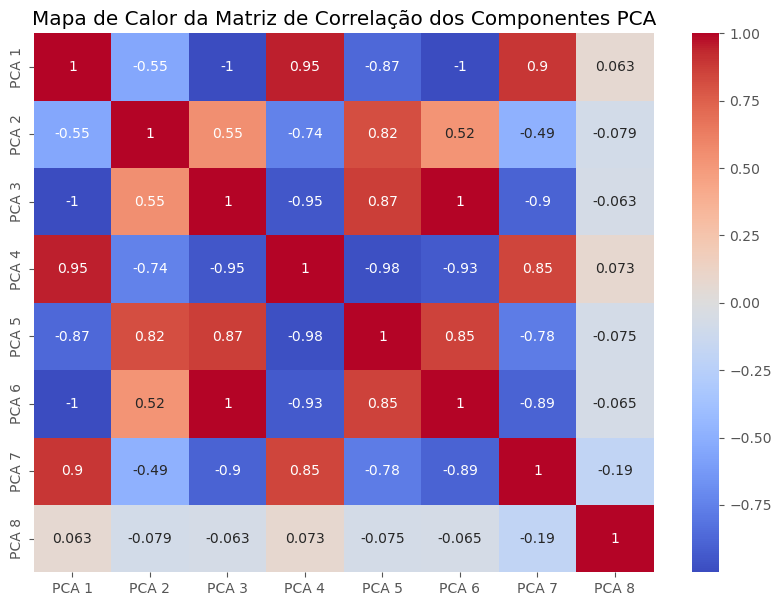

## Mapa de Calor da Matriz de Correlação dos Componentes PCA

In [15]:
temp = dfpc[['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8']].corr()

plt.figure(figsize=(10, 7))
sns.heatmap(temp, annot=True, cmap='coolwarm')
plt.title('Mapa de Calor da Matriz de Correlação dos Componentes PCA')
plt.show()
display(md('## Mapa de Calor da Matriz de Correlação dos Componentes PCA'))

In [16]:
dfpc.sample(5)

,DATPRE,CODNEG,NOMRES,ESPECI,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT,CODISI,DISMES,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9
5575680,2022-07-13,ITUB4,ITAUUNIBANCO,PN N1,22.38,22.74,22.29,22.50,22.40,22.40,22.41,33899300,7.630302e+08,NaN,0,7.637628e+08,5.526998e+06,-7057.758168,59.746740,-40.237431,-7.079148,0.799080,0.096944,0.007798
3571773,2021-12-22,ITUB4,ITAUUNIBANCO,PN N1,21.23,21.31,20.97,21.15,21.23,21.22,21.23,18091300,3.827665e+08,NaN,0,3.831743e+08,3.857868e+06,-3517.537075,40.025575,-29.840843,-3.295812,0.397676,-0.042242,-0.119371
4487063,2022-01-27,BBDC4,BRADESCO,PN N1,22.37,22.59,22.05,22.29,22.28,22.28,22.29,59735200,1.331726e+09,NaN,0,1.333026e+09,1.021627e+07,-12355.608998,87.345696,-53.964832,-12.726998,1.496028,-0.009090,-0.174452
3488627,2021-11-30,BBDC4,BRADESCO,PN N1,20.24,20.36,19.70,19.91,19.91,19.91,19.92,59141000,1.177963e+09,NaN,0,1.179347e+09,1.533524e+07,-10924.642135,77.463302,-47.935355,-11.349464,1.518616,-0.115243,-0.162793
1453621,2020-05-12,BBDC4,BRADESCO,PN EJ N1,17.92,17.97,17.10,17.49,17.10,17.10,17.12,40746500,7.127126e+08,NaN,0,7.137344e+08,1.423892e+07,-6594.748367,51.962838,-33.896292,-6.956679,1.391785,0.000160,-0.064565


In [17]:
df.sample(5)

,Unnamed: 0,TIPREG,DATPRE,CODNEG,NOMRES,ESPECI,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT,CODISI,DISMES,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9
1354726,1354726,1,2019-12-26,USIM5T,USIMINAS,PNA N1,9.63,9.64,9.63,9.63,9.64,0.00,0.00,1700,16384.38,NaN,0,16436.228397,1090.096599,21.389481,-0.149272,0.095606,0.013530,-0.008102,-0.004428,0.001576
3253848,3253848,1,2021-02-17,PETRE170,PETR,PN N2,12.74,13.61,12.74,12.75,13.61,0.00,0.00,5100,65061.00,NaN,0,65205.561870,2679.264323,28.665084,-0.199809,0.108643,-0.680115,-0.511644,-0.359329,0.102761
3008504,3008504,1,2021-02-26,CSNA3T,SID NACIONAL,ON,33.80,33.81,33.40,33.76,33.41,0.00,0.00,9000,303844.97,NaN,0,303969.569653,-2294.980952,72.376859,-0.508798,0.320745,-0.167501,0.309609,0.134948,-0.046199
5559051,5559051,1,2022-12-19,FLRY3F,FLEURY,ON NM,15.88,15.99,15.50,15.76,15.78,15.77,15.78,22499,354648.15,NaN,0,355239.203123,9307.206149,32.169649,15.900142,-15.266107,0.191350,0.087640,-0.037221,-0.068613
3465943,3465943,1,2021-06-16,VVARG210,VVAR,ON NM,0.02,0.02,0.02,0.02,0.02,0.02,0.03,1000,20.00,NaN,0,57.139242,998.566526,0.045423,0.030128,-0.019114,0.000673,-0.000049,0.000012,0.000014


In [18]:
fig = px.scatter_3d(dfpc, x='PCA 1', y='PCA 2', z='PCA 3', color='ESPECI',
                    title='Visualização 3D dos PCAs', size_max=0.1, opacity=0.5)
fig.update_layout(scene=dict(
    xaxis_title='PCA 1',
    yaxis_title='PCA 2',
    zaxis_title='PCA 3'
))
fig.show()


### Grafico de Disperção Entre cada Componentes Principais

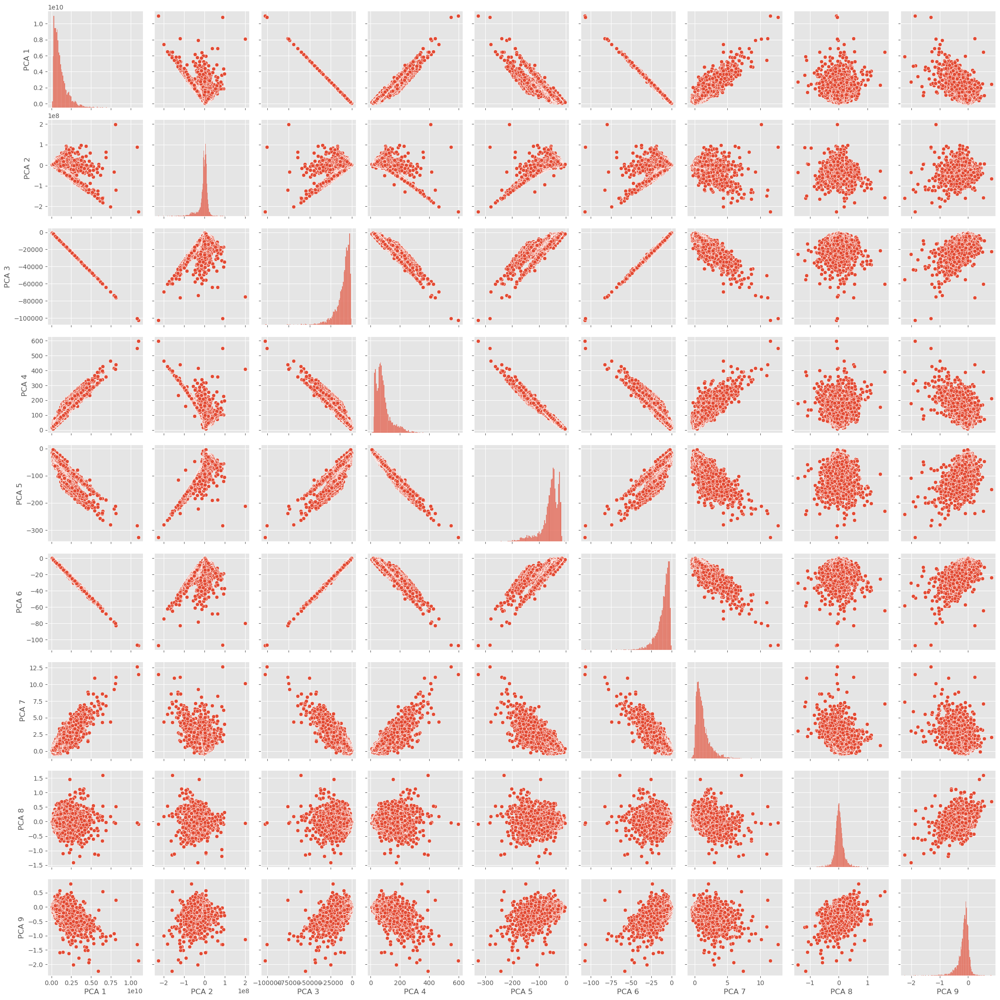

In [19]:
display(md(f'### Grafico de Disperção Entre cada Componentes Principais')) # Pequena Amostra
sns.pairplot(dfpc[['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8', 'PCA 9']])
plt.show()

In [20]:
colunas = dfpc.columns.tolist() # Criar um widget Dropdown para selecionar a coluna
coluna_dropdown = widgets.Dropdown(options=colunas, description='Coluna:')

# Função de callback para atualizar o gráfico com base na coluna selecionada
def atualizar_grafico(coluna):
    # Converter a coluna selecionada para um tipo adequado
    coluna_convertida = dfpc[coluna].astype(str)
    fig = px.scatter_3d(dfpc, x='PCA 1', y='PCA 4', z='PCA 8', color=coluna_convertida,
                        title='Visualização 3D dos PCAs', size_max=2, opacity=0.5)
    fig.update_layout(scene=dict(
        xaxis_title='PCA 11',
        yaxis_title='PCA 10',
        zaxis_title='PCA 9'
    ))
    fig.show()

# Registrar a função de callback para o evento 'on_change' do widget Dropdown
coluna_dropdown.observe(lambda change: atualizar_grafico(change.new), names='value')
# Exibir o widget Dropdown e o gráfico inicial
display(coluna_dropdown)
atualizar_grafico(coluna_dropdown.value)

Dropdown(description='Coluna:', options=('DATPRE', 'CODNEG', 'NOMRES', 'ESPECI', 'PREABE', 'PREMAX', 'PREMIN',…

### Vizualização Interativa

In [21]:
# Obter a lista de colunas do DataFrame
colunas = dfpc.columns.tolist()

# Criar um widget Dropdown para selecionar a coluna
coluna_dropdown = widgets.Dropdown(options=colunas, description='Coluna:')

# Função de callback para atualizar o gráfico com base na coluna selecionada
def atualizar_grafico(coluna):
    # Converter a coluna selecionada para um tipo adequado
    coluna_convertida = dfpc[coluna].astype(str)

    fig = px.scatter_3d(dfpc, x='PCA 1', y='PCA 4', z='PCA 8', color=coluna_convertida,
                        title='Visualização 3D dos PCAs', size_max=2, opacity=0.5)
    fig.update_layout(scene=dict(
        xaxis_title='PCA 11',
        yaxis_title='PCA 10',
        zaxis_title='PCA 9'
    ))
    fig.show()

# Registrar a função de callback para o evento 'on_change' do widget Dropdown
coluna_dropdown.observe(lambda change: atualizar_grafico(change.new), names='value')

# Exibir o widget Dropdown e o gráfico inicial
display(coluna_dropdown)
atualizar_grafico(coluna_dropdown.value)

Dropdown(description='Coluna:', options=('DATPRE', 'CODNEG', 'NOMRES', 'ESPECI', 'PREABE', 'PREMAX', 'PREMIN',…

### Distribuição dos Valores Projetados nos `Componentes`
- Identificar os pontos extremos: observações atípicas ou casos de destaque
- Agrupamento de observações: presença de grupos semelhantes
- Tendências temporais: variação dos valores nos componentes ao longo do tempo

> `Não sei qual a utilidade dessas informações`

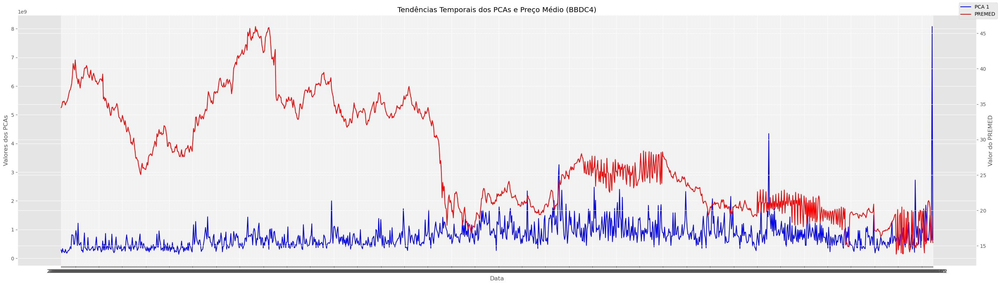

In [22]:
target = 'BBDC4'
temp = dfpc.loc[dfpc['CODNEG'] == target, :]

fig, ax1 = plt.subplots(figsize=(28, 8))

# Plot dos PCAs no eixo primário
ax1.plot(temp['DATPRE'], temp['PCA 1'], label='PCA 1', color='blue')
ax1.set_xlabel('Data')
ax1.set_ylabel('Valores dos PCAs')
ax1.tick_params(axis='y')

# Criação do eixo secundário para o PREMED
ax2 = ax1.twinx()
ax2.plot(temp['DATPRE'], temp['PREMED'], label='PREMED', color='red')
ax2.set_ylabel('Valor do PREMED')
ax2.tick_params(axis='y')

# Configuração dos títulos e legenda
ax1.set_title(f'Tendências Temporais dos PCAs e Preço Médio ({target})')
fig.tight_layout()
fig.legend()

plt.xticks(rotation=45)
plt.show()

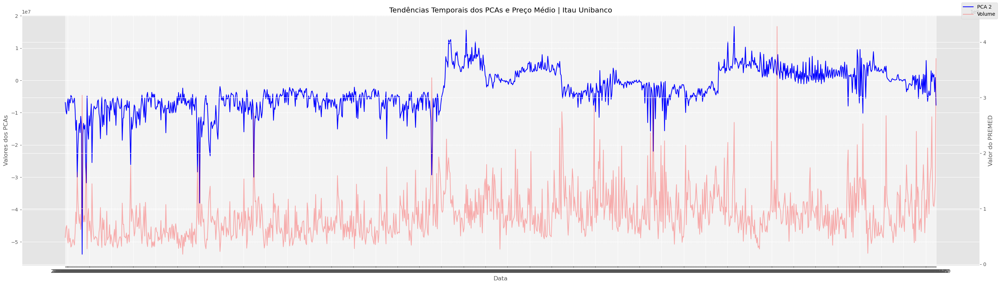

In [23]:
target = 'ITUB4'
temp = dfpc.loc[dfpc['CODNEG'] == target, :]

fig, ax1 = plt.subplots(figsize=(28, 8))

# Plot dos PCAs no eixo primário
ax1.plot(temp['DATPRE'], temp['PCA 2'], label='PCA 2', color='blue')
ax1.set_xlabel('Data')
ax1.set_ylabel('Valores dos PCAs')
ax1.tick_params(axis='y')

# Criação do eixo secundário para o PREMED
ax2 = ax1.twinx()
ax2.plot(temp['DATPRE'], temp['VOLTOT'], label='Volume', alpha=0.3, color='red')
ax2.set_ylabel('Valor do PREMED')
ax2.tick_params(axis='y')

# Configuração dos títulos e legenda
ax1.set_title(f'Tendências Temporais dos PCAs e Preço Médio | Itau Unibanco')
fig.tight_layout()
fig.legend()

plt.xticks(rotation=45)
plt.show()

In [24]:
# Estatísticas descritivas dos componentes PCA
dfpc[['PCA 1', 'PCA 2', 'PCA 3']].describe()

,PCA 1,PCA 2,PCA 3
count,6.195000e+03,6.195000e+03,6195.000000
mean,1.123786e+09,-5.233734e+06,-10395.803469
std,9.139425e+08,2.415205e+07,8503.146618
min,5.584532e+07,-2.261399e+08,-102486.075039
25%,5.012086e+08,-9.346239e+06,-13420.875420
50%,8.524404e+08,-4.530989e+05,-7862.591195
75%,1.449138e+09,7.099907e+06,-4605.122757
max,1.099559e+10,1.992464e+08,-469.461782


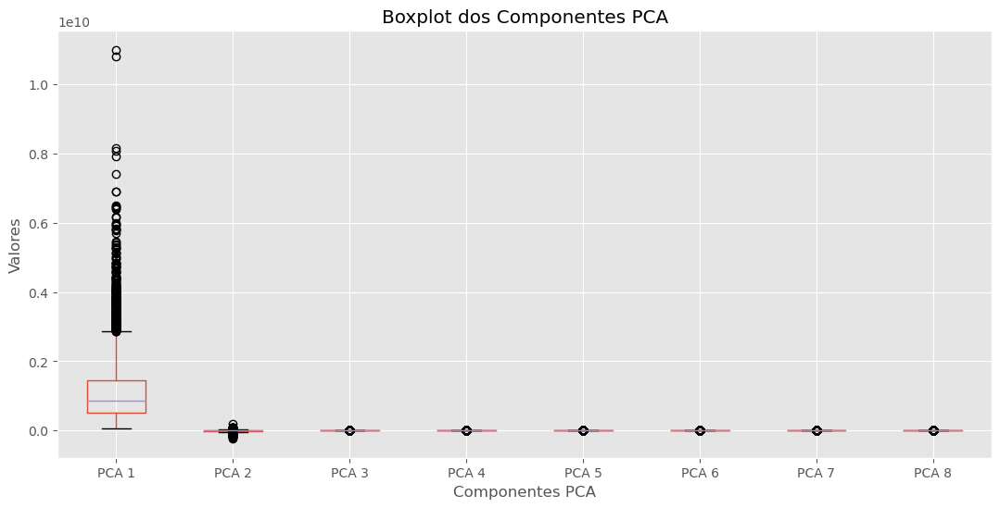

In [25]:
plt.figure(figsize=(13, 6))
dfpc[['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8']].boxplot()
plt.title('Boxplot dos Componentes PCA')
plt.xlabel('Componentes PCA')
plt.ylabel('Valores')
plt.show()

### Identificação de Outliers
> Na verdade não deveria ter, mas isso deve ser variações que ocorrem no dia, como por exemplo um escadalo

In [26]:
# Cálculo do IQR para cada componente PCA
q1 = dfpc[['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8']].quantile(0.25)
q3 = dfpc[['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8']].quantile(0.75)
iqr = q3 - q1

# Definição dos limites para identificar outliers
lower_limit = q1 - 1.5 * iqr
upper_limit = q3 + 1.5 * iqr

# Identificação de outliers
outliers = dfpc[((dfpc[['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8']] < lower_limit) |
                 (dfpc[['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8']] > upper_limit)).any(axis=1)]
display(outliers)

,DATPRE,CODNEG,NOMRES,ESPECI,PREABE,PREMAX,PREMIN,PREMED,PREULT,PREOFC,PREOFV,QUATOT,VOLTOT,CODISI,DISMES,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9
53652,2018-02-05,BBDC4,BRADESCO,PN EJ N1,38.20,39.26,37.80,38.53,37.80,37.80,37.99,11303600,4.355399e+08,NaN,0,4.356592e+08,-4.885840e+06,-3976.057392,59.459743,-47.164722,-4.008046,0.814724,0.423421,0.376389
55498,2018-02-05,VALE3,VALE,ON NM,40.60,42.04,40.33,41.13,40.35,40.34,40.35,22452800,9.236105e+08,NaN,0,9.238070e+08,-1.187765e+07,-8523.289093,85.627583,-61.503692,-8.920972,1.253557,0.512838,0.466743
56897,2018-02-06,ITUB4,ITAUUNIBANCO,PN ED N1,49.98,52.26,49.96,51.40,51.83,51.83,52.00,59151400,3.040597e+09,NaN,0,3.040695e+09,-5.385687e+07,-28255.763009,200.570010,-124.136065,-30.014321,2.094252,0.443204,-0.344969
76522,2018-02-20,ITUB4,ITAUUNIBANCO,PN EDJ N1,50.30,51.94,50.20,51.35,51.67,51.65,51.67,17253000,8.860487e+08,NaN,0,8.860780e+08,-1.567832e+07,-8152.521595,95.208327,-71.537957,-8.368558,0.061098,0.338894,-0.126676
78787,2018-02-21,ITUB4,ITAUUNIBANCO,PN EDJ N1,51.97,53.25,51.97,52.60,52.35,52.34,52.35,19082300,1.003820e+09,NaN,0,1.003836e+09,-1.822586e+07,-9248.680547,101.623321,-75.051848,-9.079939,0.824616,0.362217,0.244270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5674677,2022-11-03,VALE3,VALE,ON NM,67.64,67.94,66.58,67.14,67.15,67.15,67.18,34390300,2.309153e+09,NaN,0,2.308837e+09,-5.142553e+07,-21400.793897,180.181443,-121.120241,-21.390696,2.807736,-0.145992,-0.371116
5675421,2022-12-01,VALE3,VALE,ON NM,86.42,86.75,84.73,85.99,86.18,86.18,86.19,34319300,2.951304e+09,NaN,0,2.950542e+09,-7.535434e+07,-27357.802130,230.625736,-155.153285,-27.560304,3.349937,-0.128091,-0.906046
5676344,2022-10-27,PETR4,PETROBRAS,PN N2,32.81,33.54,32.67,33.06,32.96,32.96,32.97,111008800,3.669959e+09,NaN,0,3.671549e+09,-2.541800e+07,-34145.261654,212.075299,-121.182161,-35.644311,3.842270,0.157240,-0.314717
5676392,2022-11-09,ITUB4,ITAUUNIBANCO,PN EJ N1,28.66,29.07,27.85,28.48,28.15,28.15,28.16,129923500,3.701163e+09,NaN,0,3.703435e+09,-7.675692e+06,-34435.835632,208.748169,-117.303014,-36.275439,4.387575,0.092834,-0.476927


### Os Melhores Componentes *aparentemente* são os `1`, `2` e `3`

In [27]:
fig = px.scatter_3d(dfpc, x='PCA 1', y='PCA 2', z='PCA 3', color='NOMRES',
                    title='Visualização 3D dos PCAs', size_max=2, opacity=0.5)
fig.update_layout(scene=dict(
    xaxis_title='PCA 1',
    yaxis_title='PCA 2',
    zaxis_title='PCA 3'
))
fig.show()

In [28]:
fig = px.scatter_3d(dfpc, x='PCA 1', y='PCA 2', z='PCA 4', color='NOMRES',
                    title='Visualização 3D dos PCAs', size_max=2, opacity=0.5)
fig.update_layout(scene=dict(
    xaxis_title='PCA 3',
    yaxis_title='PCA 4',
    zaxis_title='PCA 5'
))
fig.show()

In [29]:
fig = px.scatter_3d(dfpc, x='PCA 1', y='PCA 4', z='PCA 8', color='NOMRES',
                    title='Visualização 3D dos PCAs', size_max=2, opacity=0.5)
fig.update_layout(scene=dict(
    xaxis_title='PCA 11',
    yaxis_title='PCA 10',
    zaxis_title='PCA 9'
))
fig.show()

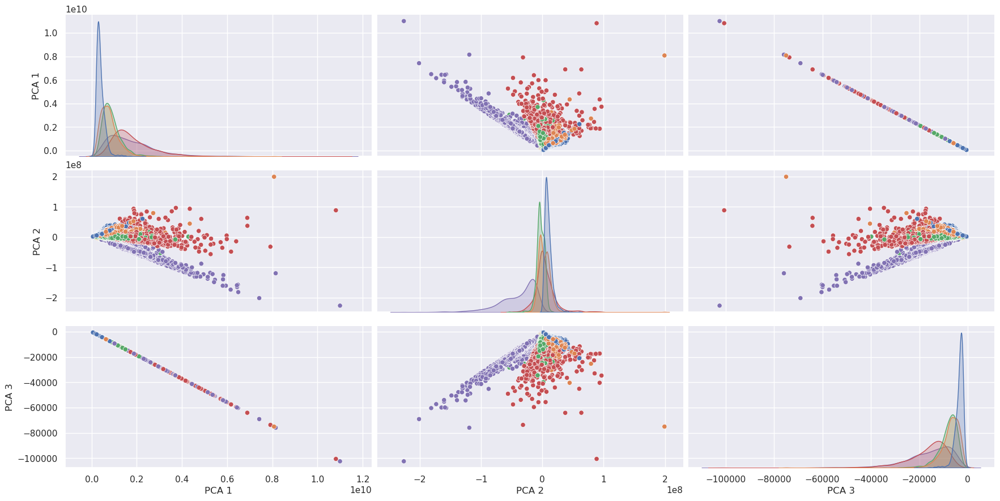

In [30]:
sns.set(rc={'figure.figsize':(42,42)})
sns.pairplot( dfpc, vars=['PCA 1', 'PCA 2', 'PCA 3'], hue='CODNEG', height=3, aspect=10/5 )._legend.remove()
plt.show()

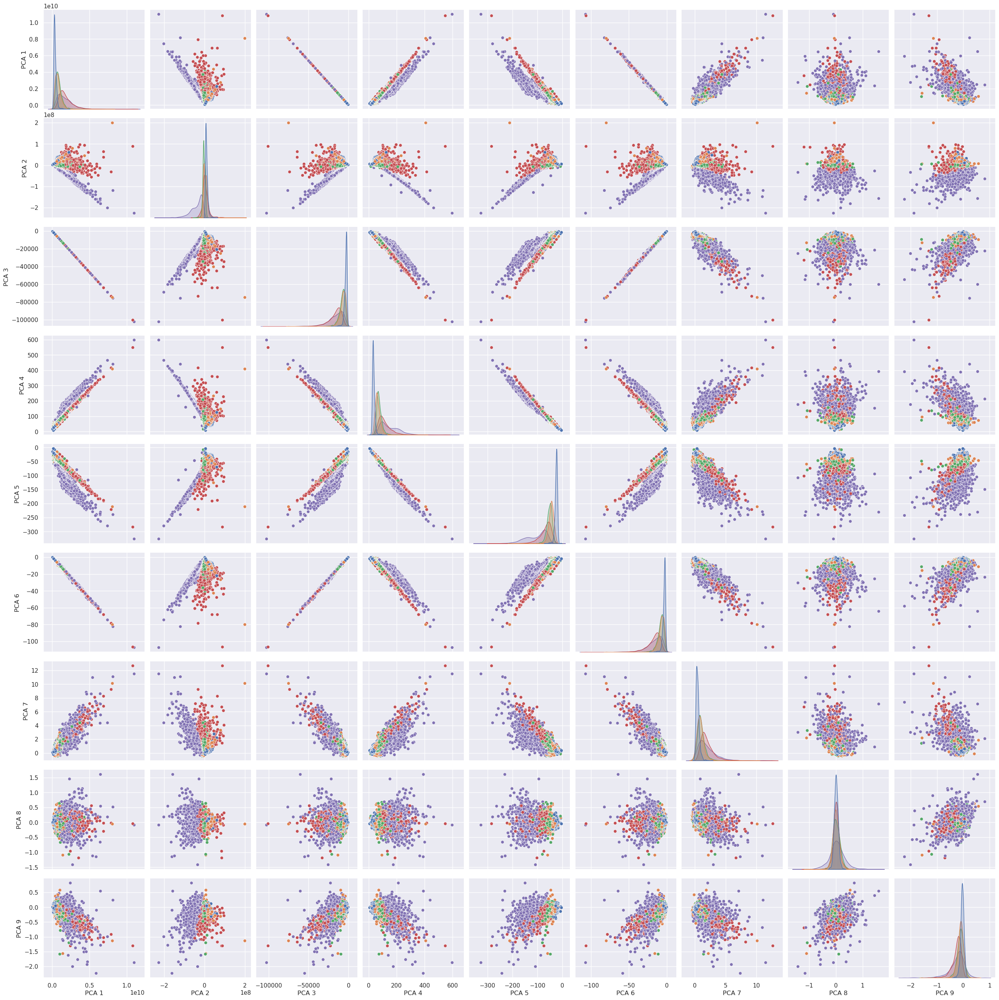

In [31]:
sns.set(rc={'figure.figsize':(42,42)})
sns.pairplot( dfpc, vars=['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4', 'PCA 5', 'PCA 6', 'PCA 7', 'PCA 8', 'PCA 9'], hue='CODNEG', height=3 )._legend.remove()
plt.show()

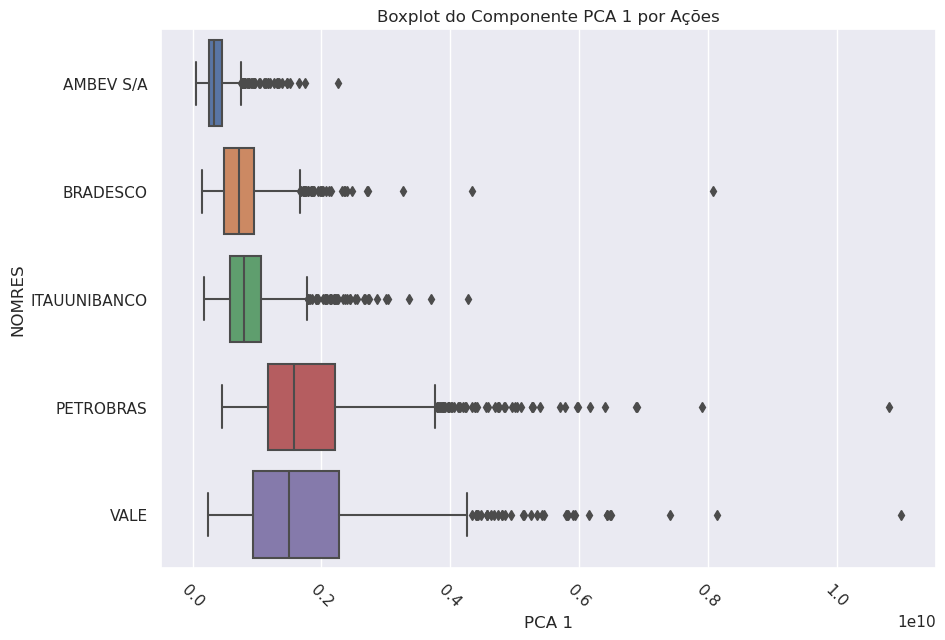

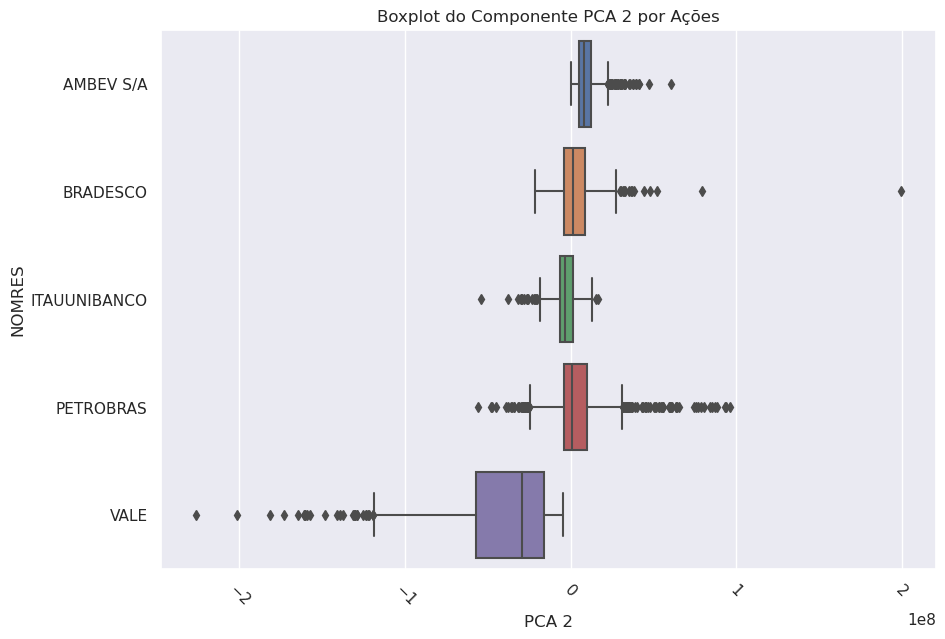

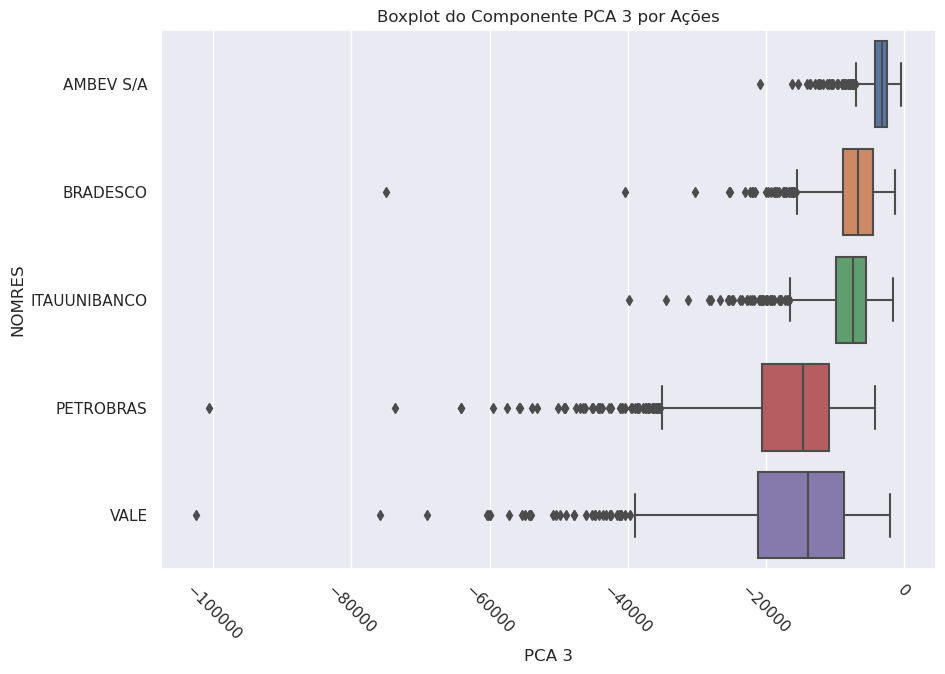

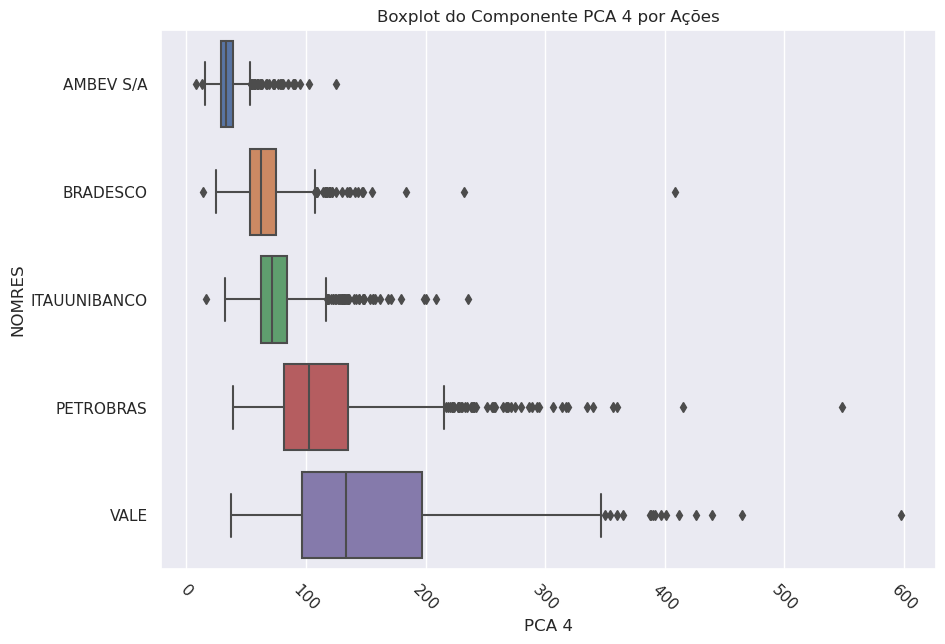

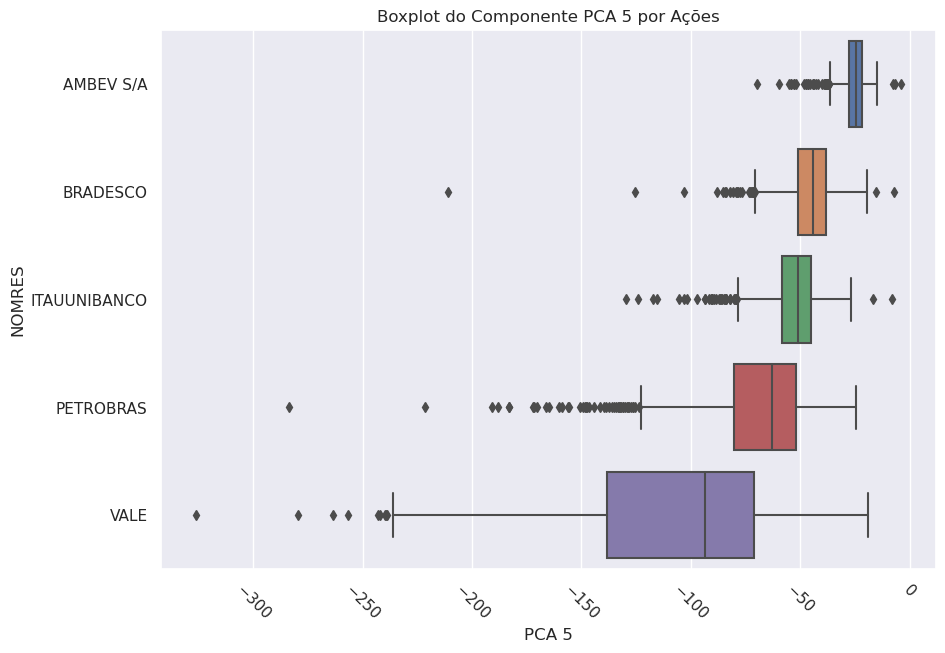

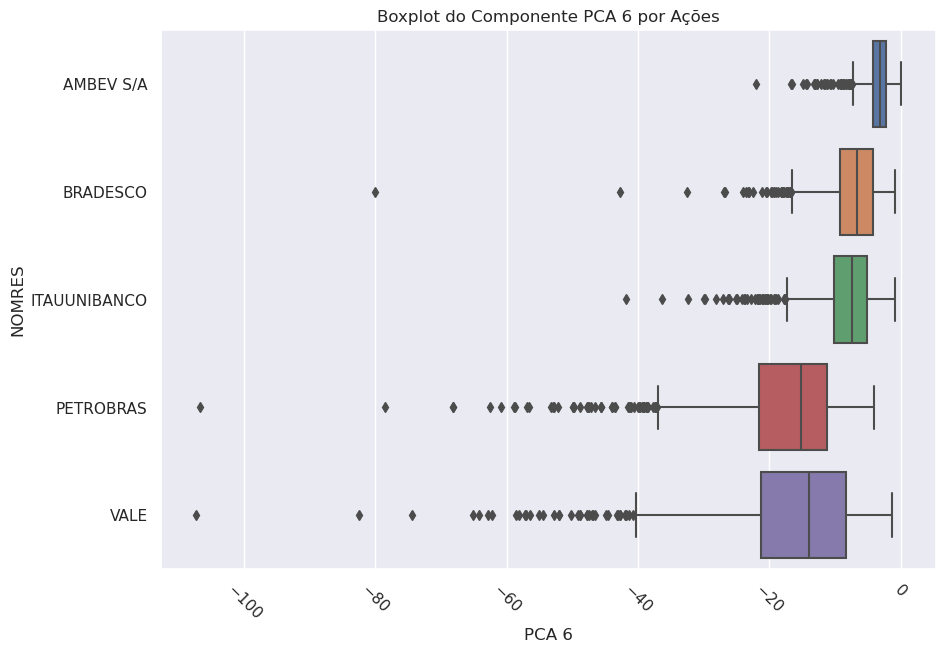

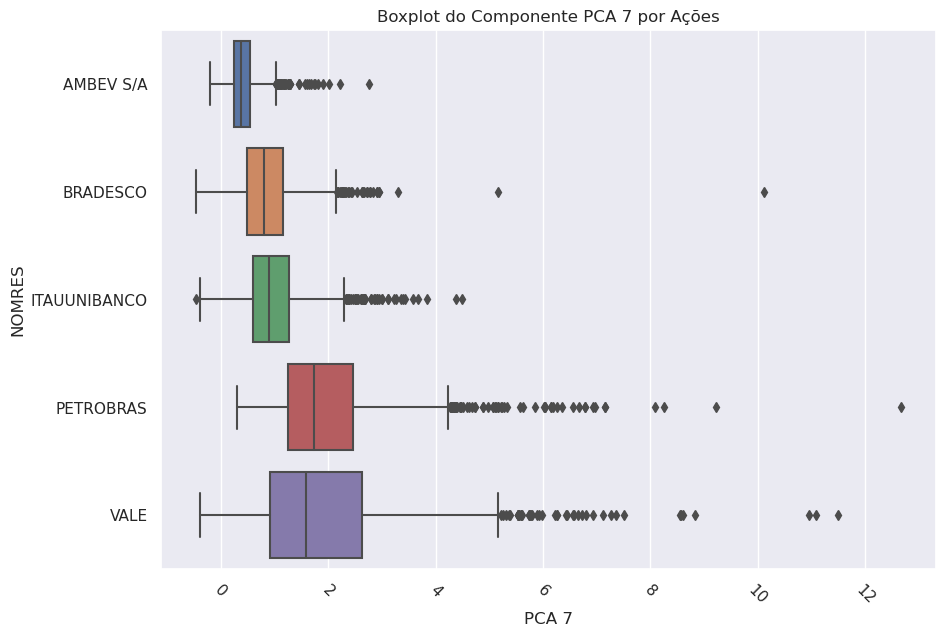

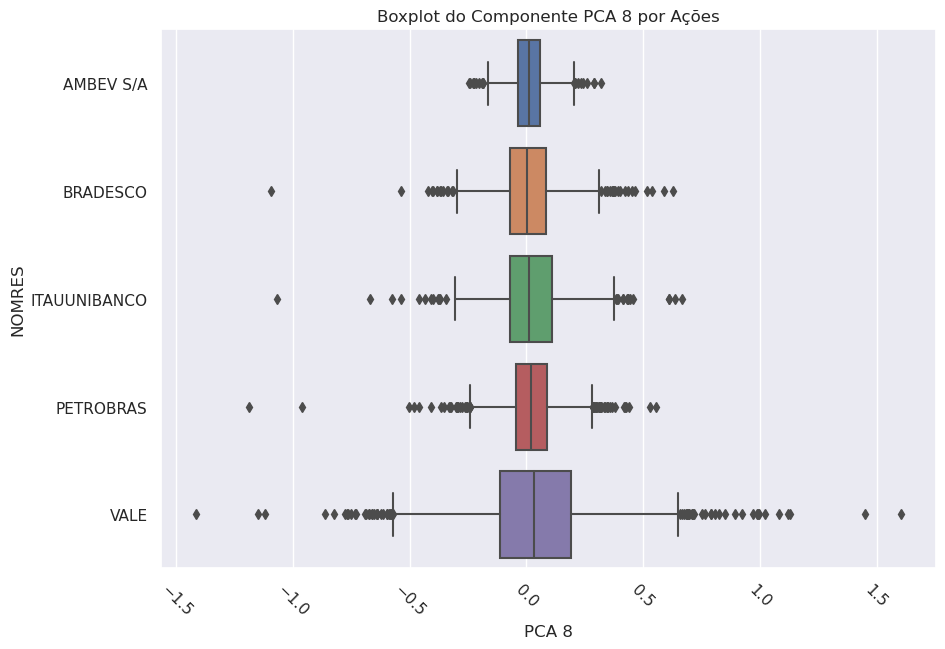

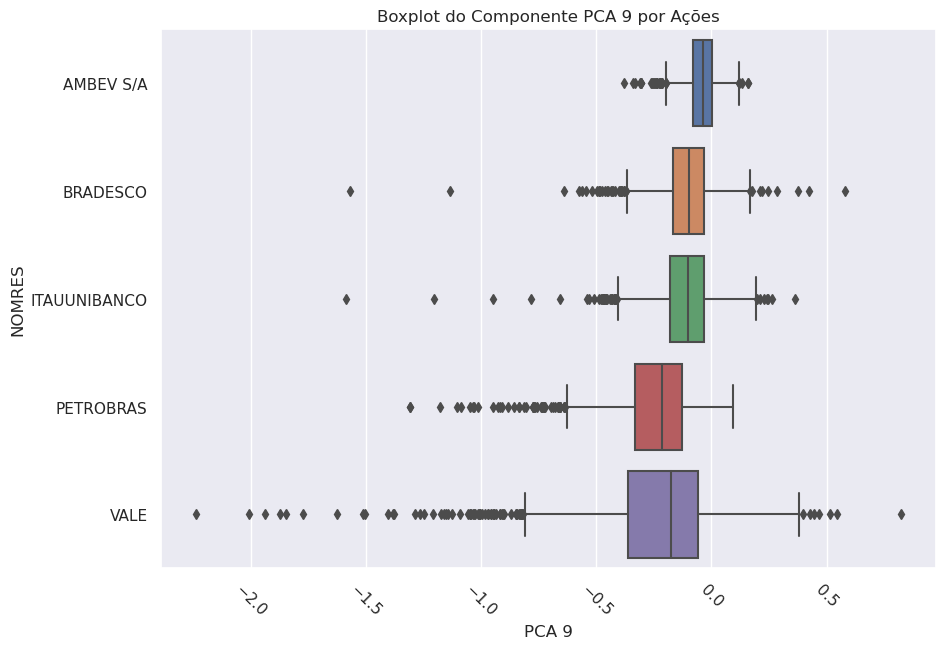

In [32]:
# Boxplot dos componentes PCA por categoria (NOMRES)
for i in range(1, 10):
    plt.figure(figsize=(10, 7))
    sns.boxplot(data=dfpc, x=f'PCA {i}', y='NOMRES')
    plt.title(f'Boxplot do Componente PCA {i} por Ações')
    plt.xticks(rotation=-45)
    plt.show()

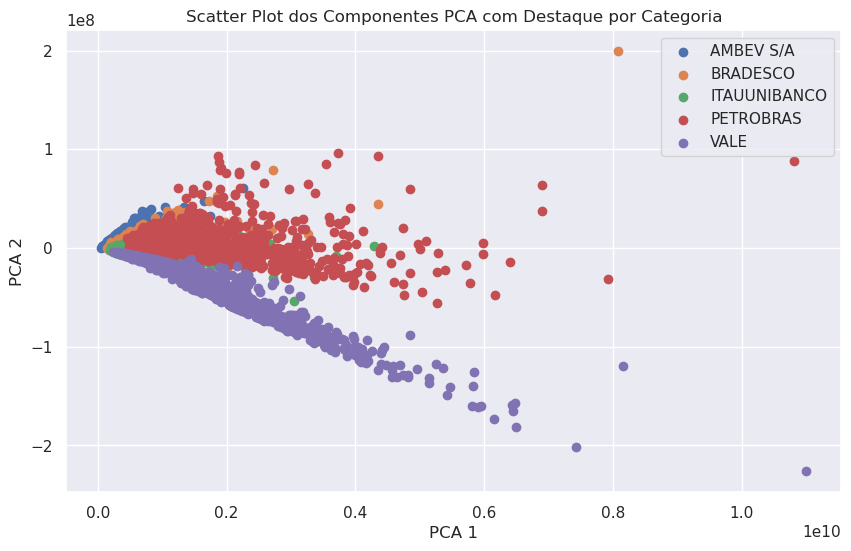

In [33]:
# Scatter plot dos componentes PCA com destaque por categoria (NOMRES)
plt.figure(figsize=(10, 6))
for category in dfpc['NOMRES'].unique():
    plt.scatter(dfpc.loc[dfpc['NOMRES'] == category, 'PCA 1'],
                dfpc.loc[dfpc['NOMRES'] == category, 'PCA 2'],
                label=category)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Scatter Plot dos Componentes PCA com Destaque por Categoria')
plt.legend()
plt.show()

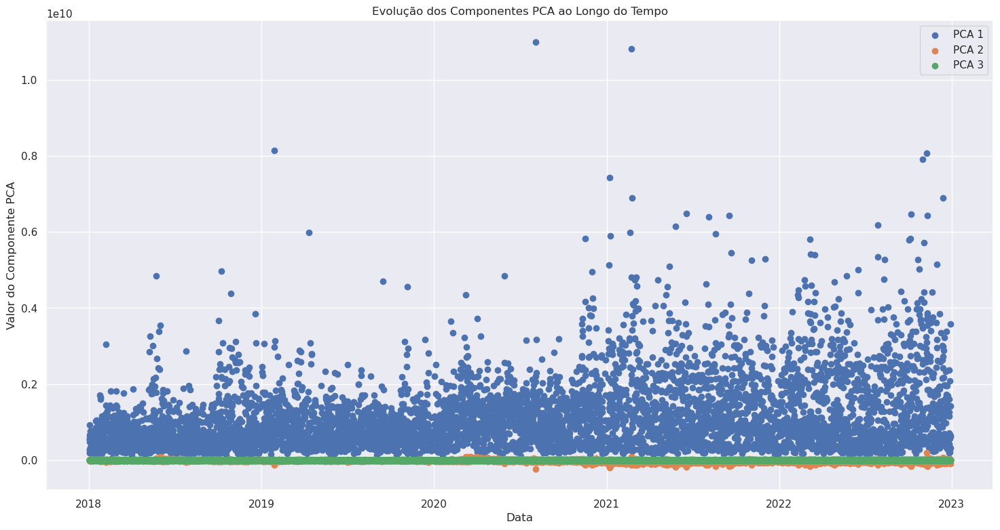

In [34]:
# Converter a coluna 'DATPRE' para o tipo de dados de data e hora
dfpc['DATPRE'] = pd.to_datetime(dfpc['DATPRE'])
plt.figure(figsize=(18, 9))

# Plot dos componentes PCA ao longo do tempo
plt.scatter(dfpc['DATPRE'], dfpc['PCA 1'], label='PCA 1')
plt.scatter(dfpc['DATPRE'], dfpc['PCA 2'], label='PCA 2')
plt.scatter(dfpc['DATPRE'], dfpc['PCA 3'], label='PCA 3')

# Configuração do título, rótulos dos eixos x e y, e legenda
plt.title('Evolução dos Componentes PCA ao Longo do Tempo')
plt.xlabel('Data')
plt.ylabel('Valor do Componente PCA')
plt.legend()

# Definir a frequência dos ticks no eixo x para exibir somente os anos
years = mdates.YearLocator()
plt.gca().xaxis.set_major_locator(years)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.show()


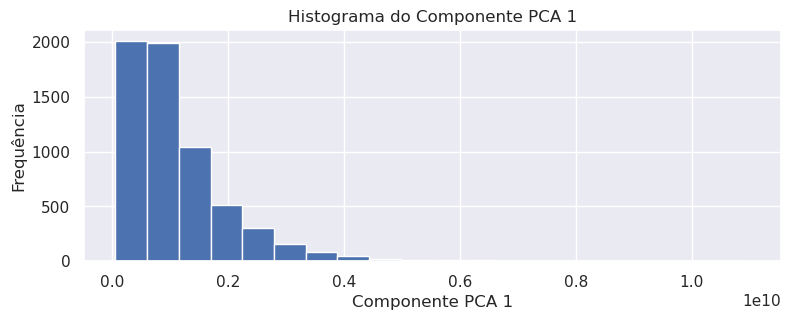

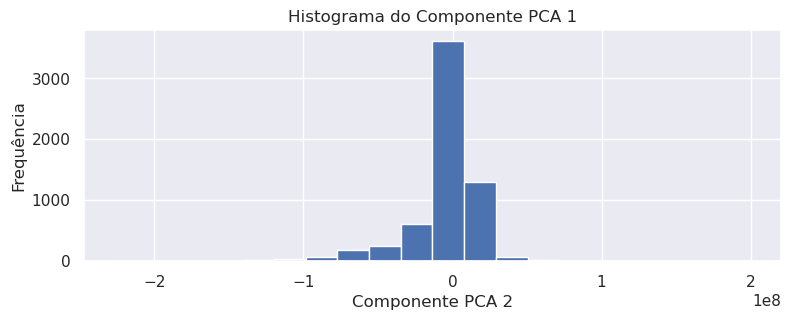

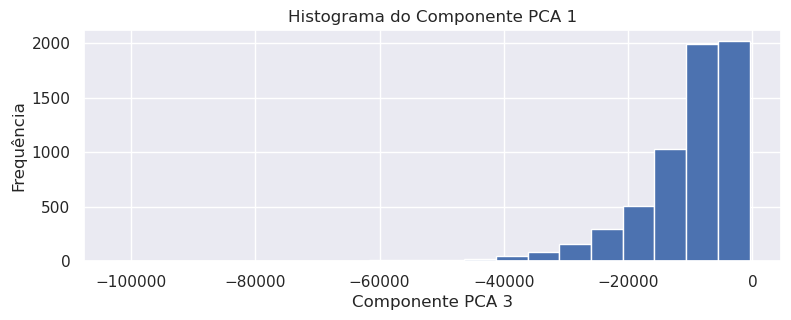

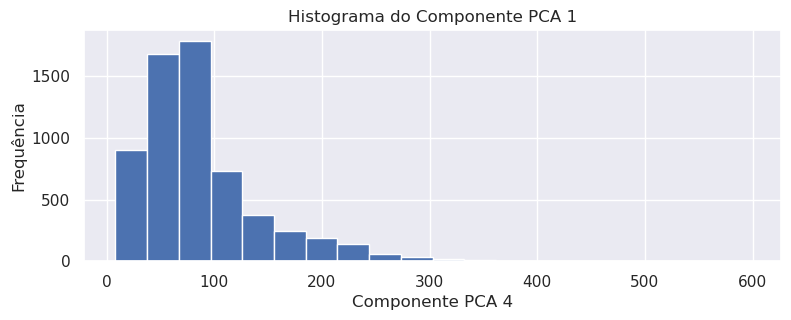

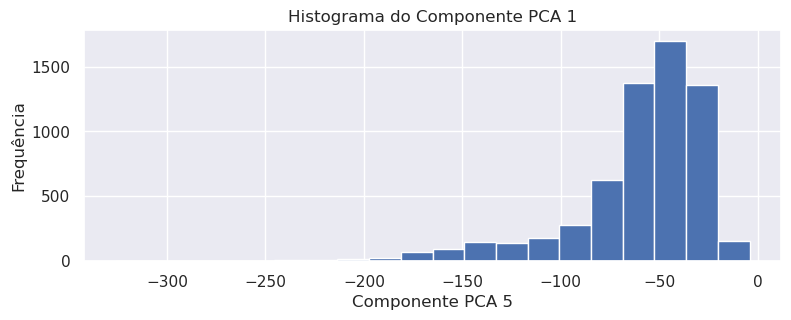

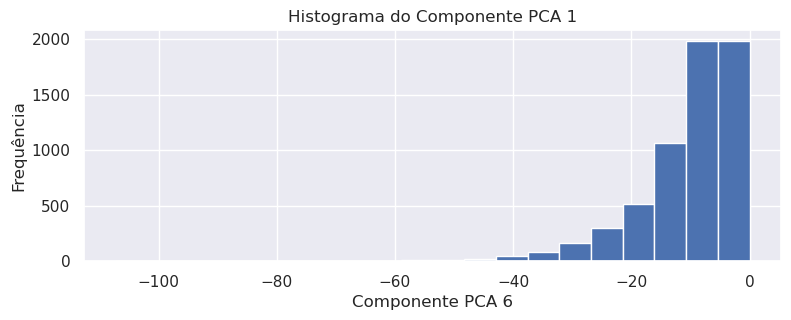

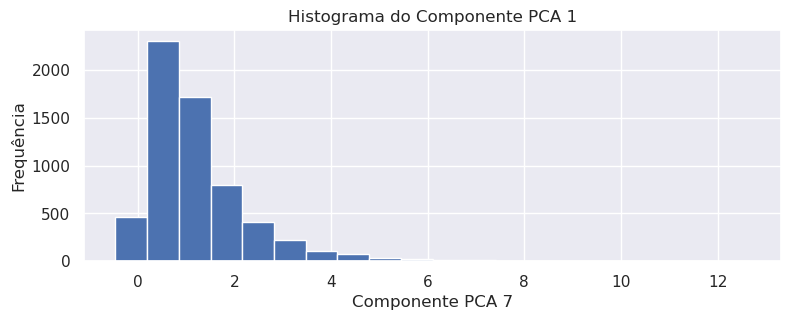

In [35]:
for i in range(1, 8):
    plt.figure(figsize=(9, 3))
    plt.hist(dfpc[f'PCA {i}'], bins=20)
    plt.xlabel(f'Componente PCA {i}')
    plt.ylabel('Frequência')
    plt.title('Histograma do Componente PCA 1')
    plt.show()

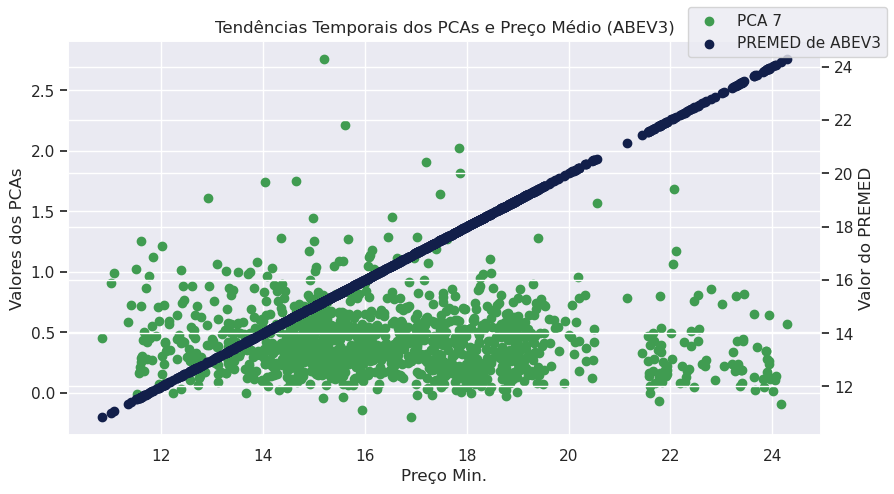

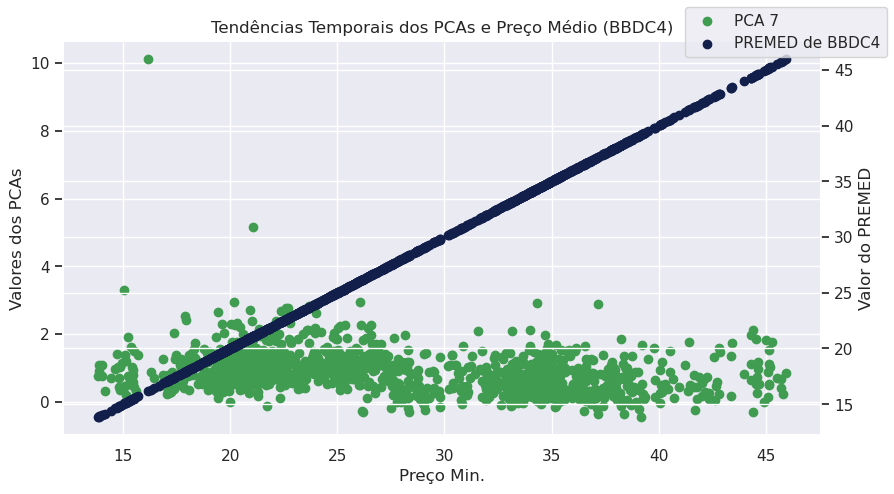

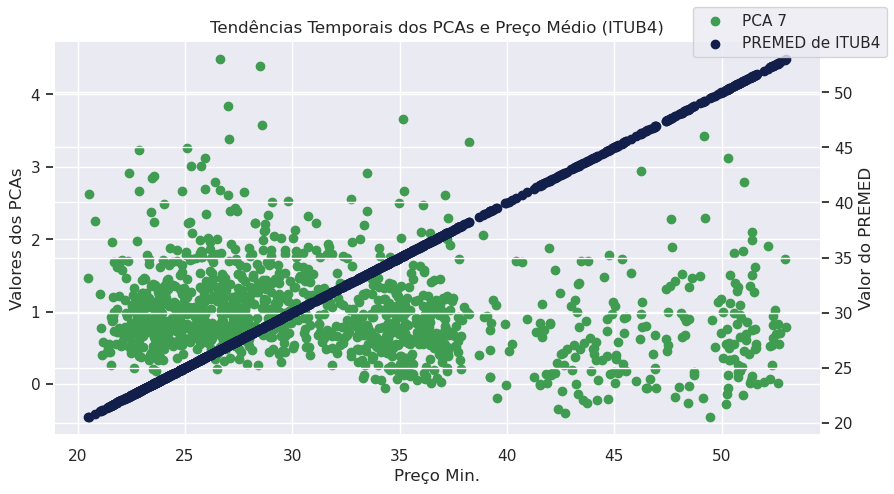

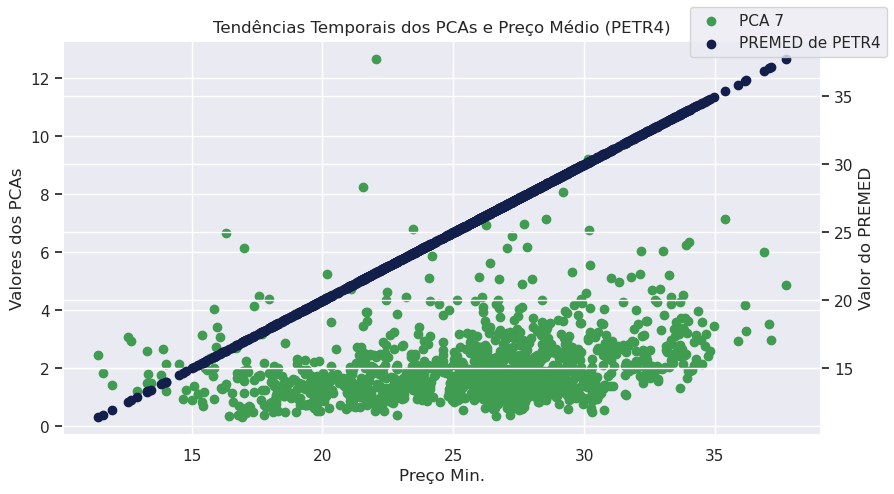

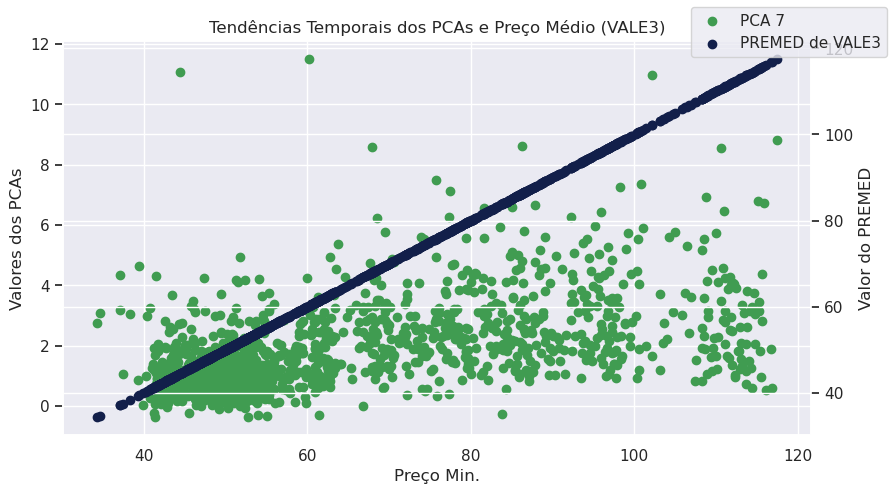

In [36]:
for target in dfpc['CODNEG'].unique().tolist():
    temp = dfpc.loc[dfpc['CODNEG'] == target, :]

    fig, ax1 = plt.subplots(figsize=(9, 5))
        
    # Plot dos PCAs no eixo primário
    ax1.scatter(temp['PREMED'], temp[f'PCA {i}'], label=f'PCA {i}', color='#409c51')
    ax1.set_xlabel('Preço Min.')
    ax1.set_ylabel('Valores dos PCAs')
    ax1.tick_params(axis='y')

    # Criação do eixo secundário para o PREMED
    ax2 = ax1.twinx()
    ax2.scatter(temp['PREMED'], temp['PREMED'], label=f'PREMED de {target}', color='#121f4a')
    ax2.set_ylabel('Valor do PREMED')
    ax2.tick_params(axis='y')

    # Configuração dos títulos e legenda
    ax1.set_title(f'Tendências Temporais dos PCAs e Preço Médio ({target})')
    fig.tight_layout()
    fig.legend()

    plt.xticks(rotation=45)
    plt.show()